# Intro to Data Management with Python
# Sketch an analysis for Solar Power Generation Dataset

Kritkorn Supyen (Data Enginering, Jacobs University Bremen)

# 3. Data Analyse

In [1]:
import pandas as pd
from sqlalchemy import create_engine
import datamanagement as dm
import json

In [2]:
# Set no row limit for displaying dataframe
pd.set_option('display.max_rows', None)
# Turn off warning
pd.options.mode.chained_assignment = None  # default='warn'

## 3.1 Connect to MySQL server

In [3]:
# Use a JSON file to hide MySQL credentials a little bit.
parameters_file = open('MySQLparameter.json')
parameters_value = json.load(parameters_file)
parameters_file.close()

db_str = ('mysql://{user}:{password}@{host}:{port}').format(**parameters_value)

# Create the connection
db_connection = create_engine(db_str)

## 3.2 Use database

Use database named PowerGeneration

In [4]:
# Use database
database_name = 'PowerGeneration'
command = "USE {}".format(database_name)
mycursor = db_connection.execute(command)

## 3.3 Query data from Plant_All table

In [5]:
table_name = 'Plant_All'
df_all = pd.read_sql('SELECT * FROM {}'.format(table_name), con=db_connection)
display(df_all.head())

,DATE_TIME,PLANT_ID,SOURCE_KEY_INVERTER,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,SOURCE_KEY_SENSOR,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DATE,TIME
0,2020-05-15,4135001,1BY6WEcLGh8j5v7,0.0,0.0,0.0,6259559.0,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0,2020-05-15,0 days
1,2020-05-15,4135001,1IF53ai7Xc0U56Y,0.0,0.0,0.0,6183645.0,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0,2020-05-15,0 days
2,2020-05-15,4135001,3PZuoBAID5Wc2HD,0.0,0.0,0.0,6987759.0,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0,2020-05-15,0 days
3,2020-05-15,4135001,7JYdWkrLSPkdwr4,0.0,0.0,0.0,7602960.0,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0,2020-05-15,0 days
4,2020-05-15,4135001,McdE0feGgRqW7Ca,0.0,0.0,0.0,7158964.0,HmiyD2TTLFNqkNe,25.184316,22.857507,0.0,2020-05-15,0 days


In [6]:
display(df_all.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136472 entries, 0 to 136471
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype          
---  ------               --------------   -----          
 0   DATE_TIME            136472 non-null  datetime64[ns] 
 1   PLANT_ID             136472 non-null  object         
 2   SOURCE_KEY_INVERTER  136472 non-null  object         
 3   DC_POWER             136472 non-null  float64        
 4   AC_POWER             136472 non-null  float64        
 5   DAILY_YIELD          136472 non-null  float64        
 6   TOTAL_YIELD          136472 non-null  float64        
 7   SOURCE_KEY_SENSOR    136472 non-null  object         
 8   AMBIENT_TEMPERATURE  136472 non-null  float64        
 9   MODULE_TEMPERATURE   136472 non-null  float64        
 10  IRRADIATION          136472 non-null  float64        
 11  DATE                 136472 non-null  datetime64[ns] 
 12  TIME                 136472 non-null  timedelta64[ns]
dtyp

None

## 3.4 Inverters optimization.

### 3.4.1 Find efficiencies of the inverters.

I will find the efficiency of the inverters for both power plants. 

The fomula that I will use come from the following link which is "Efficiency = (AC power/DC power) * 100".

https://www.linquip.com/blog/efficiency-of-inverter/

Note: 
From now on I will consider the plant with id 4135001 as plant 1 and plant with id 4136001 as plant 2.

In [7]:
import matplotlib.pyplot as plt
from matplotlib.dates import AutoDateLocator, AutoDateFormatter, date2num, DateFormatter, HourLocator, MinuteLocator
import datetime

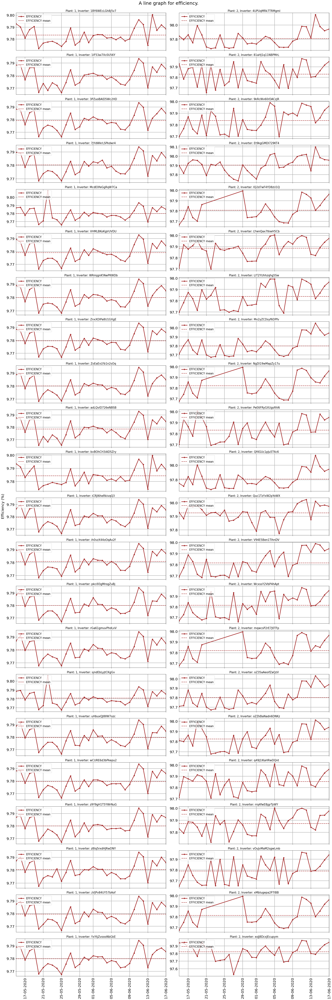

In [8]:
sources_1 = df_all['SOURCE_KEY_INVERTER'][df_all['PLANT_ID']=='4135001']
sources_2 = df_all['SOURCE_KEY_INVERTER'][df_all['PLANT_ID']=='4136001']
sources = [sources_1.unique(), sources_2.unique()]
title = 'A line graph for efficiency.'
y1_list = ['EFFICIENCY']
y1_label = 'Efficiency (%)'

dm.plotInverter(df_all, sources, title, y1_list, y1_label)

According to the link above, the efficiency should be around 85 and 95 percent or 90 percent in average.

On one hand, inverter from the plant 2 did a very good job for efficency with approximately 97.8%.

On the other hand, all of the inverters in plant 1 have extremely low efficiency around 9.78%. This can happend because of two cases. 
- The first one is efficiencies of the inverters are genuinely low and need to maintain. 
- The other reason maybe unit of the data AC and DC power in plant 1 is not correct. 

Summary, I think the cause is the first one because the efficiency of plant 1 is too low. Moreover, if the values are multiplied by 10, the efficiency will be similar to plant 2 which makes more sense. However, the supervisor of the power plant need to check for this problem immediately. 

## 3.4.2 Find the faulty inverter

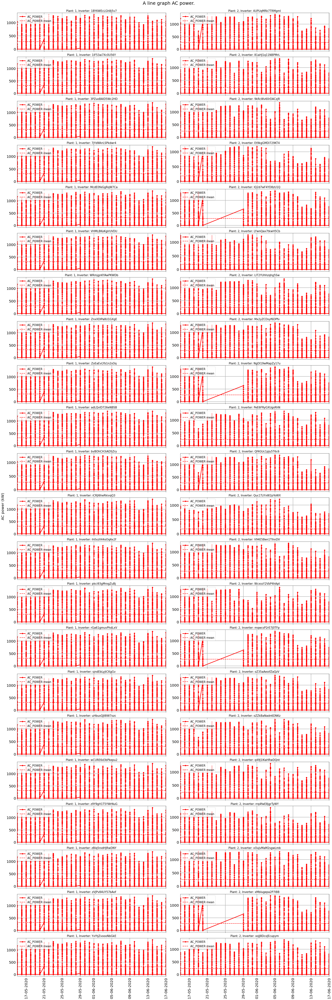

In [9]:
# Make a time series graph of data vs new_deaths and new cases.

sources_1 = df_all['SOURCE_KEY_INVERTER'][df_all['PLANT_ID']=='4135001']
sources_2 = df_all['SOURCE_KEY_INVERTER'][df_all['PLANT_ID']=='4136001']
sources = [sources_1.unique(), sources_2.unique()]

title = 'A line graph AC power.'
y1_list = ['AC_POWER']
y1_label = 'AC power (kW)'

dm.plotInverter(df_all, sources, title, y1_list, y1_label, mean_data=False)


If you look at the plant 2, you will see there are 4 inverters that has missing data between 21-05-2020 and 29-05-2020 which are IQ2d7wF4YD8zU1Q, NgDl19wMapZy17u, mqwcsP2rE7J0TFp, xMbIugepa2P7lBB.

This event, in my opinion, happened from 1 of 4 following condition.
1. Inverters itselves were malfunction and didn't convert power from DC to AC.
2. PVs were malfunction and didn't generate any power.
3. Sensors at weather/inverter were malfunction and didn't collect data causing data loss.
4. The whole system of 4 inverters was intentionally off duty for instance on yearly maintainance.

Let's look between DC and AC power first, so we will know whether inverters were malfunction or PVs (1 and 2).

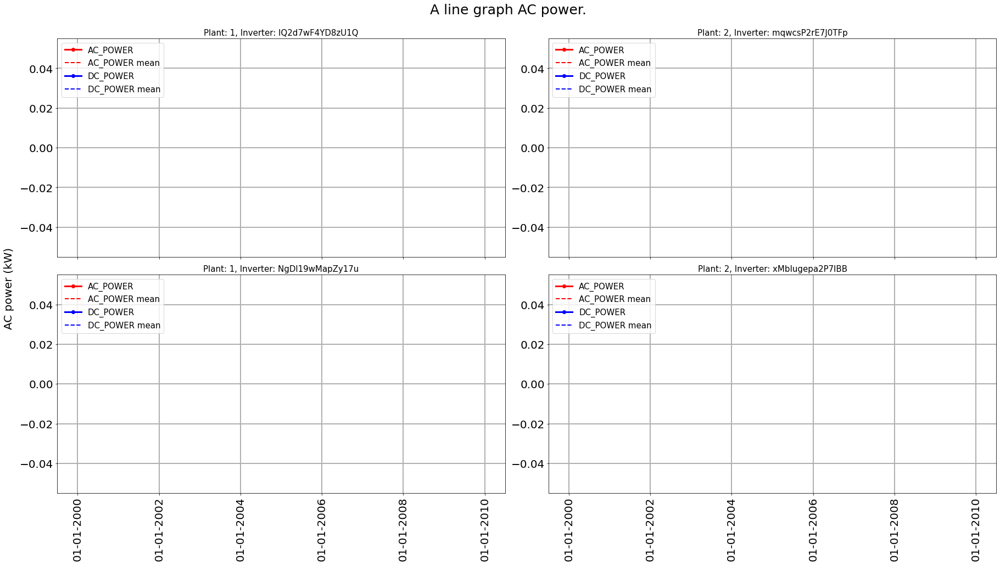

In [10]:
sources_2_missing = [[sources_2.unique()[4], sources_2.unique()[8]], [sources_2.unique()[14], sources_2.unique()[20]]]

title = 'A line graph AC power.'
y1_list = ['AC_POWER', 'DC_POWER']
y1_label = 'AC power (kW)'
start_date = datetime.datetime(2020, 5, 21, 0, 0, 0)
end_date = datetime.datetime(2020, 5, 29, 0, 0, 0)
figsize = (25,15)

dm.plotInverter(df_all, sources_2_missing, title, y1_list, y1_label, start_date=start_date, end_date=end_date, figsize=figsize)


It seems that no DC power was produced during the period. This can be assumed that PV didn't generate any power for the inverters to convert power from DC to AC.

Look further in weather data.

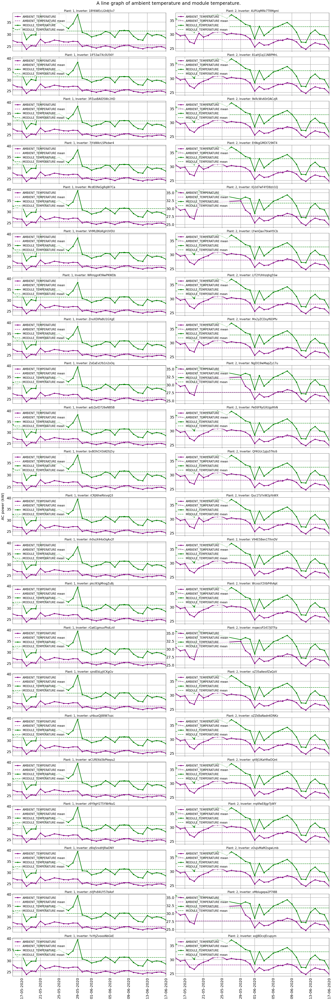

In [11]:
# Make a time series graph of data vs new_deaths and new cases.

sources_1 = df_all['SOURCE_KEY_INVERTER'][df_all['PLANT_ID']=='4135001']
sources_2 = df_all['SOURCE_KEY_INVERTER'][df_all['PLANT_ID']=='4136001']
sources = [sources_1.unique(), sources_2.unique()]

title = 'A line graph of ambient temperature and module temperature.'
y1_list = ['AMBIENT_TEMPERATURE', 'MODULE_TEMPERATURE']
y1_label = 'AC power (kW)'

dm.plotInverter(df_all, sources, title, y1_list, y1_label)


As you can see, there is no weather data between 21-05-2020 and 29-05-2020 as same as both AC and DC power.

In addition, from the graph above the module temperature is vary according to ambient temperature.

Next, let's compare power daily for AC power and Daily yield.

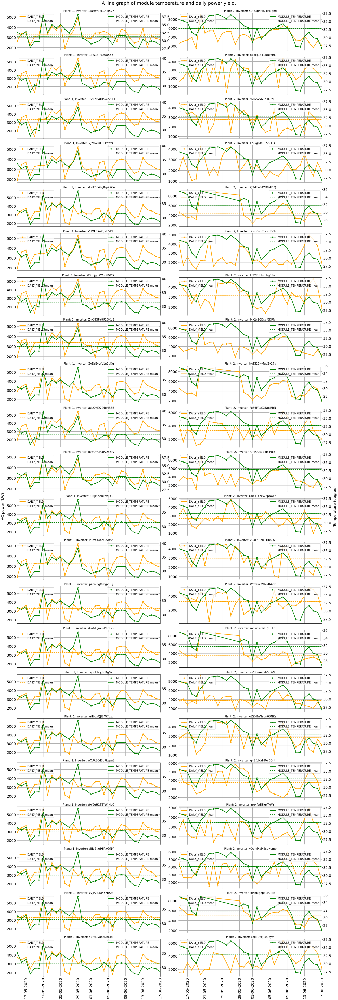

In [12]:
sources_1 = df_all['SOURCE_KEY_INVERTER'][df_all['PLANT_ID']=='4135001']
sources_2 = df_all['SOURCE_KEY_INVERTER'][df_all['PLANT_ID']=='4136001']
sources = [sources_1.unique(), sources_2.unique()]

title = 'A line graph of module temperature and daily power yield.'
y1_list = ['DAILY_YIELD']
y1_label = 'AC power (kW)'
y2_list = ['MODULE_TEMPERATURE']
y2_label = 'Temperature (degree)'

dm.plotInverter(df_all, sources, title, y1_list, y1_label, y2_list, y2_label)


In conclusion, from the graphs there was no data in temperature, ac power, dc power and daily yield in the period. This assumes that it is case (4) which is the inverters were stopped working by intention. 

## 3.5 Prediction of AC_POWER

### 3.5.1 Finding features

From the visualization above I noticed that the variation of average Daily Yield is pretty similar to Module Temperature. Therefore, I will plot and compare between AC power and Module temperature to see the trend.

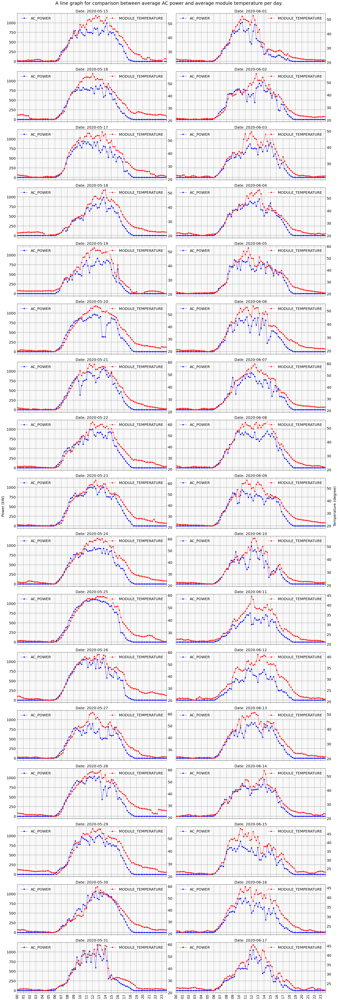

In [13]:
# Make a time series graph of data vs new_deaths and new cases.
pd.options.mode.chained_assignment = None  # default='warn'

split_data = lambda x : [x[:len(x)//2], x[len(x)//2:]]

sources = split_data(df_all['DATE'].unique())

# Initial 
fig, axes = plt.subplots(len(sources[0]), len(sources), figsize=(25,80), sharex=True, sharey=True)
fig.suptitle('A line graph for comparison between average AC power and average module temperature per day.', fontsize=25)

for i in range(len(sources)):
    for j in range(len(sources[i])):
        # Data for the plot
        df_plot = df_all[df_all["DATE"]==sources[i][j]]
        df_plot['TIME'] = datetime.datetime(2020, 6, 15, 0, 0, 0) + df_plot['TIME']
        df_plot = df_plot.groupby('TIME', as_index=False).mean()
        #display(df_plot.head())

        y1 = df_plot['AC_POWER']
        y2 = df_plot['MODULE_TEMPERATURE']
        x = df_plot['TIME']

        # Plot axes[0]
        axes[j][i].plot(x, y1, linewidth=1, label=y1.name, color="blue", linestyle='-', marker='o')
        #axes[j][i].axhline(y1.mean(), linewidth=2, label=y1.name+' mean', color="blue", linestyle='--')
        axes2 = axes[j][i].twinx()
        axes2.plot(x, y2, linewidth=1, label=y2.name, color="red", linestyle='-', marker='o')
        date = str(sources[i][j]).split('T')
        axes[j][i].set_title('Date: {}'.format(date[0]), fontsize=20)
        #axes[j][i].set_xlabel('Dates')
        #axes[j][i].set_ylabel('Temperature (Degree)', labelpad=5, fontsize=15)
         

        # For X Locator
        locator = AutoDateLocator()
        # Find all hours
        hours_each = HourLocator()
        # Find all minutes
        mins_each = MinuteLocator(interval=15)

        # X-axis limit
        min_date = min(x)
        max_date = max(x)
        min_date_num = date2num(min_date)
        max_date_num = date2num(max_date)

        # Tick label format style
        dateFmt = DateFormatter('%H')

        # Set the x-axis major tick marks
        axes[j][i].xaxis.set_major_locator(hours_each)
        #axes[j][i].xaxis.set_major_locator(locator)
        # Set the x-axis labels
        axes[j][i].xaxis.set_major_formatter(dateFmt)
        # Set the x-axis minor tick marks
        axes[j][i].xaxis.set_minor_locator(mins_each)        
        axes[j][i].set_xlim([min_date_num, max_date_num])
        axes[j][i].tick_params(axis='x', labelsize=20, rotation = 90)
        axes[j][i].tick_params(axis='y', labelsize=20)
        axes[j][i].grid(which='major', linestyle = '-', linewidth = 2)
        axes[j][i].grid(which='minor', linestyle = '--', linewidth = 1)
        axes[j][i].legend(fontsize=20, loc='upper left')
        axes2.legend(fontsize=20, loc='upper right')
        axes2.tick_params(axis='y', labelsize=20)
        #axes2.set_yscale('log')

fig.tight_layout(rect=[0, 0.03, 1, 0.98])
#fig.text(0.5, 0.04, 'Date', ha='center')
fig.text(-0.01, 0.5, 'Power (kW)', va='center', rotation='vertical', fontsize=20)
fig.text(1, 0.5, 'Temperature (degree)', va='center', rotation='vertical', fontsize=20)
plt.show()


Furthermore, let's look on the relationship between Irradiation and AC power also.

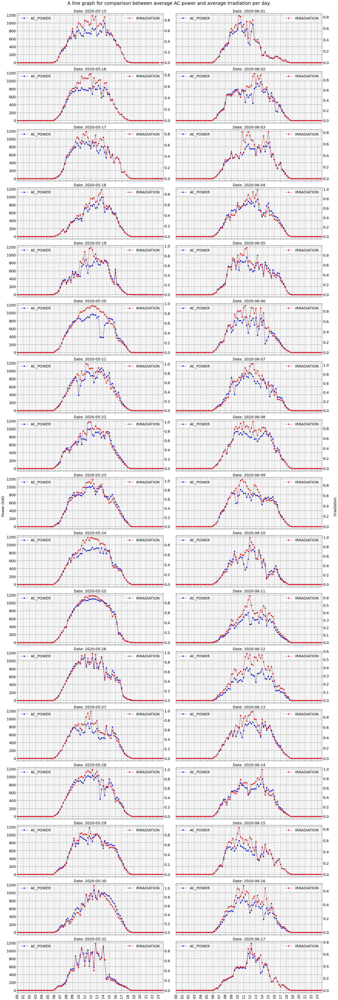

In [14]:
# Make a time series graph of data vs new_deaths and new cases.
pd.options.mode.chained_assignment = None  # default='warn'

split_data = lambda x : [x[:len(x)//2], x[len(x)//2:]]

sources = split_data(df_all['DATE'].unique())

# Initial 
fig, axes = plt.subplots(len(sources[0]), len(sources), figsize=(25,80), sharex=True, sharey=True)
fig.suptitle('A line graph for comparison between average AC power and average Irradiation per day.', fontsize=25)

for i in range(len(sources)):
    for j in range(len(sources[i])):
        # Data for the plot
        df_plot = df_all[df_all["DATE"]==sources[i][j]]
        df_plot['TIME'] = datetime.datetime(2020, 6, 15, 0, 0, 0) + df_plot['TIME']
        df_plot = df_plot.groupby('TIME', as_index=False).mean()
        #display(df_plot.head())

        y1 = df_plot['AC_POWER']
        y2 = df_plot['IRRADIATION']
        x = df_plot['TIME']

        # Plot axes[0]
        axes[j][i].plot(x, y1, linewidth=1, label=y1.name, color="blue", linestyle='-', marker='o')
        #axes[j][i].axhline(y1.mean(), linewidth=2, label=y1.name+' mean', color="blue", linestyle='--')
        axes2 = axes[j][i].twinx()
        axes2.plot(x, y2, linewidth=1, label=y2.name, color="red", linestyle='-', marker='o')
        #axes2.axhline(y2.mean(), linewidth=2, label=y2.name+' mean', color="red", linestyle='--')
        date = str(sources[i][j]).split('T')
        axes[j][i].set_title('Date: {}'.format(date[0]), fontsize=20)
        #axes[j][i].set_xlabel('Dates')
        #axes[j][i].set_ylabel('Temperature (Degree)', labelpad=5, fontsize=15)
         
        # For X Locator
        locator = AutoDateLocator()
        # Find all hours
        hours_each = HourLocator()
        # Find all minutes
        mins_each = MinuteLocator(interval=15)

        # X-axis limit
        min_date = min(x)
        max_date = max(x)
        min_date_num = date2num(min_date)
        max_date_num = date2num(max_date)

        # Tick label format style
        dateFmt = DateFormatter('%H')

        # Set the x-axis major tick marks
        axes[j][i].xaxis.set_major_locator(hours_each)
        #axes[j][i].xaxis.set_major_locator(locator)
        # Set the x-axis labels
        axes[j][i].xaxis.set_major_formatter(dateFmt)
        # Set the x-axis minor tick marks
        axes[j][i].xaxis.set_minor_locator(mins_each)        
        axes[j][i].set_xlim([min_date_num, max_date_num])
        axes[j][i].tick_params(axis='x', labelsize=20, rotation = 90)
        axes[j][i].tick_params(axis='y', labelsize=20)
        axes[j][i].grid(which='major', linestyle = '-', linewidth = 2)
        axes[j][i].grid(which='minor', linestyle = '--', linewidth = 1)
        axes[j][i].legend(fontsize=20, loc='upper left')
        axes2.legend(fontsize=20, loc='upper right')
        axes2.tick_params(axis='y', labelsize=20)
        #axes2.set_yscale('log')

fig.tight_layout(rect=[0, 0.03, 1, 0.98])
#fig.text(0.5, 0.04, 'Date', ha='center')
fig.text(-0.01, 0.5, 'Power (kW)', va='center', rotation='vertical', fontsize=20)
fig.text(1, 0.5, 'Irradiation', va='center', rotation='vertical', fontsize=20)
plt.show()



Apparently, the trends of Ac power are vary according to module temperature and irradiation. We can use this for features of the model.

### 3.5.2 Use Correlation Matrix to find features of the model

To have a better vitualization, let's create a Correlation Matrix to find correlation between columns.

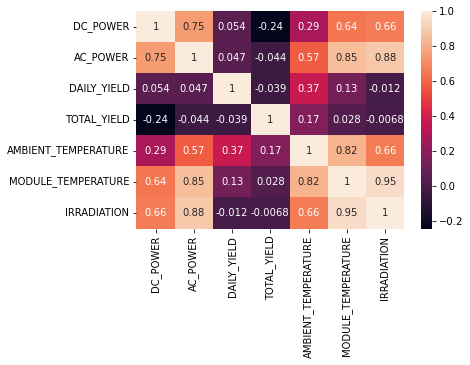

In [15]:
import pandas as pd
import seaborn as sn

corrMatrix = df_all.corr()
sn.heatmap(corrMatrix, annot=True)
plt.show()

Choose MODULE_TEMPERATURE and IRRADIATION to be the features becuase both of them have high correlation with AC_POWER (0.85 and 0.88 respectively).

### 3.6 Split dataset

In [16]:
import numpy as np

# Create train and test dataset

df_plot = df_all.copy()
#df_plot['TIME'] = datetime.datetime(2020, 6, 15, 0, 0, 0) + df_plot['TIME']
df_plot = df_plot.groupby('DATE_TIME', as_index=False).mean()
#display(df_plot)

features = ['MODULE_TEMPERATURE', 'IRRADIATION']
#features = ['IRRADIATION']
result = 'AC_POWER'

cutoff = int(np.ceil(0.7*df_plot.shape[0]))
df_train = df_plot[:cutoff]
df_test = df_plot[cutoff:]

df_x_train, df_Y_train = df_train[features], df_train[result]
df_x_test, df_Y_test = df_test[features], df_test[result]


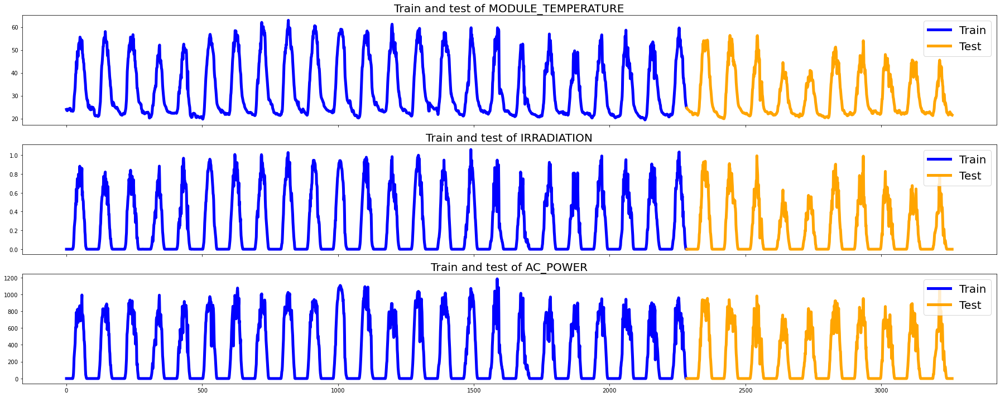

In [17]:
fig, axes = plt.subplots(1+len(features), figsize=(25,10), sharex=True)

#features.append(result)

for i in range(len(features)):
    axes[i].plot(df_train[features[i]], linewidth=5, label='Train', color="blue")
    axes[i].plot(df_test[features[i]], linewidth=5, label='Test', color="orange")
    axes[i].set_title('Train and test of {}'.format(features[i]), fontsize=20)
    axes[i].legend(fontsize=20)

axes[len(features)].plot(df_train[result], linewidth=5, label='Train', color="blue")
axes[len(features)].plot(df_test[result], linewidth=5, label='Test', color="orange")
axes[len(features)].set_title('Train and test of {}'.format(result), fontsize=20)
axes[len(features)].legend(fontsize=20)

fig.tight_layout()
plt.show()

## 3.7 Building and training models

### 3.7.1 Using Long Short-Term Memory (LSTM)

In [18]:
from keras.models import Sequential
from keras.layers import Dense, Activation, CuDNNLSTM, LSTM
from tensorflow.keras import optimizers

model = Sequential()
#model.add(CuDNNLSTM(50, return_sequences=True, input_shape=(df_x_train.shape[1], 1)))
#model.add(CuDNNLSTM(50, return_sequences=False))
model.add(LSTM(50, return_sequences=True, input_shape=(df_x_train.shape[1], 1)))
model.add(LSTM(50, return_sequences=False))
model.add(Dense(50, activation='relu'))
model.add(Dense(1))

from keras.callbacks import ModelCheckpoint, EarlyStopping
#filepath = 'models.{epoch:02d}-{loss:0.4f}-{mean_absolute_error:0.4f}-{val_mean_absolute_error:0.4f}.hdf5'
filepath = 'models/{epoch:02d}-{loss:0.4f}-{mae:0.4f}-{val_mae:0.4f}.hdf5'

callbacks = [EarlyStopping(monitor='val_loss', patience=50),
             ModelCheckpoint(filepath, monitor='loss', save_best_only=True, mode='min')]

optimizers.Adam(lr=0.0001)

model.compile(optimizer='adam', loss='mse', metrics=['mae'])

#model.fit(df_x_train, df_Y_train, validation_split=0.2, epochs=1000, callbacks=callbacks, batch_size=8)

model.load_weights('models/60-2829.4780-24.2398-29.5145.hdf5')

predict = model.predict(df_x_test)


2021-12-06 23:47:46.867053: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
/Users/kritkorns/opt/miniconda3/envs/mmm014/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


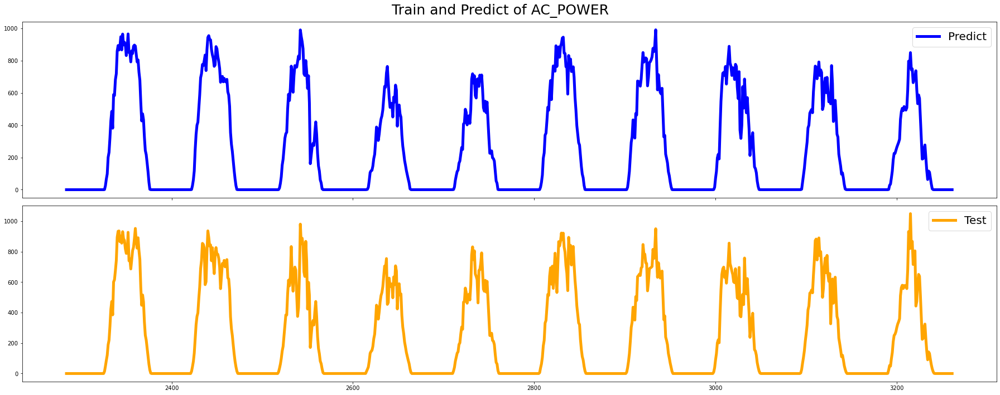

Mean absolute error is 25.1707


In [19]:
index = df_Y_test.index
df_predict = pd.DataFrame(predict, index=index)

# Plot graph
fig, axes = plt.subplots(2, figsize=(25,10), sharex=True)
fig.suptitle('Train and Predict of {}'.format(result), fontsize=25)

#features.append(result)
axes[0].plot(df_predict, linewidth=5, label='Predict', color="blue")
axes[1].plot(df_Y_test, linewidth=5, label='Test', color="orange")
axes[0].legend(fontsize=20)
axes[1].legend(fontsize=20)

fig.tight_layout()
plt.show()

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import explained_variance_score
MAE = mean_absolute_error(y_true = df_Y_test, y_pred = df_predict)
print('Mean absolute error is {:0.4f}'.format(MAE))

### 3.7.2 Using Echo State Network (ESN)

Using Numpy backend.
100% (2229 of 2229) |####################| Elapsed Time: 0:00:02 Time:  0:00:02


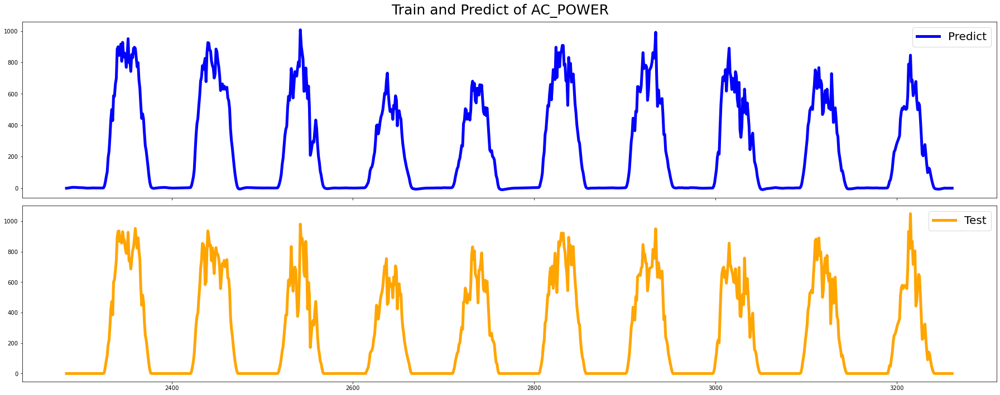

Mean absolute error is 24.7350


In [20]:
from easyesn.optimizers import GradientOptimizer
from easyesn import PredictionESN
from easyesn.optimizers import GridSearchOptimizer
from easyesn import helper as hlp

# 
esn = PredictionESN(n_input=len(features), n_output=1, n_reservoir=2000, 
                    leakingRate=0.2, regressionParameters=[1e-2], solver="lsqr", feedback=False)

esn.fit(df_x_train, df_Y_train, transientTime="Auto", verbose=1)
one_step_prediction = esn.predict(df_x_test)

index = df_Y_test.index
df_predict = pd.Series(one_step_prediction.T[0], index=index)

# Plot graph
fig, axes = plt.subplots(2, figsize=(25,10), sharex=True)
fig.suptitle('Train and Predict of {}'.format(result), fontsize=25)

#features.append(result)
axes[0].plot(df_predict, linewidth=5, label='Predict', color="blue")
axes[1].plot(df_Y_test, linewidth=5, label='Test', color="orange")
axes[0].legend(fontsize=20)
axes[1].legend(fontsize=20)

fig.tight_layout()
plt.show()

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import explained_variance_score
MAE = mean_absolute_error(y_true = df_Y_test, y_pred = df_predict)
print('Mean absolute error is {:0.4f}'.format(MAE))

If you compare between 2 models (LSTM and ESN), ESN has better result with MAE equals to 24.5137 than LSTM with MAE equals to 25.1707.

In conclusion, ESN will be chose to make the prediction further more.